# Generative Adversarial Networks (GANs)

This notebook explores the implementation of Generative Adversarial Networks (GANs) using TensorFlow and Keras, specifically for generating images similar to the Fashion MNIST dataset. We'll cover both a basic GAN architecture and a Deep Convolutional GAN (DCGAN).

## Setup and Imports

First, we import necessary libraries like TensorFlow, Keras, NumPy, Matplotlib, and scikit-learn. We also set up some plotting configurations.

In [ ]:
import sklearn
assert sklearn.__version__ >= "0.20"
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

## GPU Availability Check

This section verifies if a GPU is available and configured for TensorFlow, which can significantly speed up model training.

In [ ]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
if tf.test.is_built_with_cuda():
    print("TensorFlow is built with CUDA support.")
else:
    print("TensorFlow is NOT built with CUDA support.")

if tf.config.list_physical_devices('GPU'):
    print("A GPU is detected and available.")
    # Further check if it's actually being used
    try:
        with tf.device('/GPU:0'):
            a = tf.constant([[1.0, 2.0], [3.0, 4.0]])
            b = tf.constant([[1.0, 1.0], [0.0, 1.0]])
            c = tf.matmul(a, b)
            print(f"TensorFlow operations can run on GPU. Result of sample matmul: {c.numpy()}")
    except RuntimeError as e:
        print(f"Error using GPU: {e}")
else:
    print("No GPU detected. Running on CPU.")

Num GPUs Available:  1
TensorFlow is built with CUDA support.
A GPU is detected and available.
TensorFlow operations can run on GPU. Result of sample matmul: [[1. 3.]
 [3. 7.]]


## Helper Function for Plotting Images

This function will be used to visualize the generated images during and after training.

In [ ]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

## Data Loading and Preprocessing

We load the Fashion MNIST dataset, normalize the pixel values, and split it into training and validation sets.

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

## Basic Generative Adversarial Network (GAN)

This section implements a basic GAN architecture consisting of a generator and a discriminator. The generator learns to create realistic images, while the discriminator learns to distinguish between real and fake images.

###GAN

In [ ]:
np.random.seed(42)
tf.random.set_seed(42)

codings_size = 30

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


### Model Compilation

We compile the discriminator and the combined GAN model. The discriminator is compiled separately so its weights can be frozen during generator training.

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

### Dataset Preparation

We prepare the training data into batches for efficient training.

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

### GAN Training Function

This function defines the training loop for the GAN, alternating between training the discriminator and the generator.

In [ ]:

def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)
        plt.show()

### Helper Function for Plotting Multiple Images

This function helps visualize a grid of generated images.

In [ ]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

### Initial GAN Training

We train the basic GAN for a few epochs to observe its initial performance.

Epoch 1/10


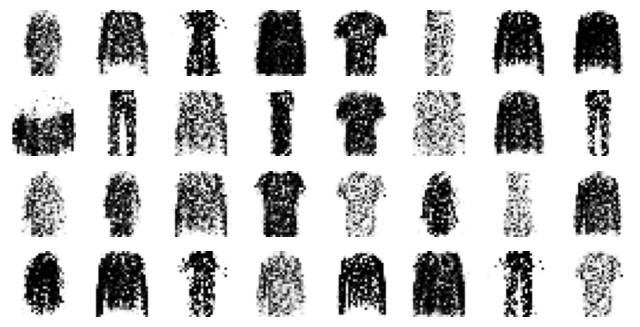

Epoch 2/10


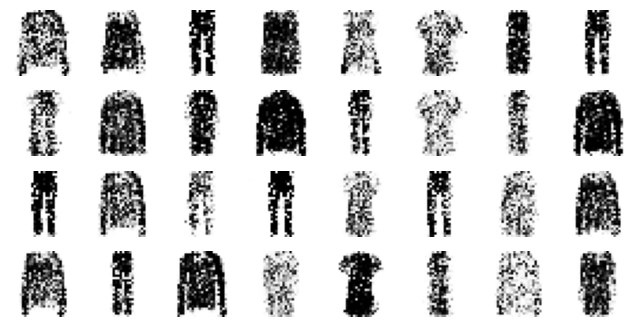

Epoch 3/10


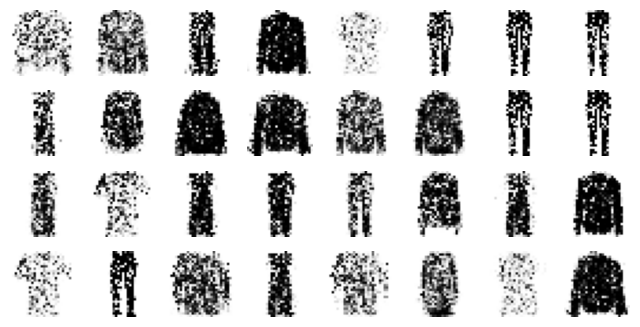

Epoch 4/10


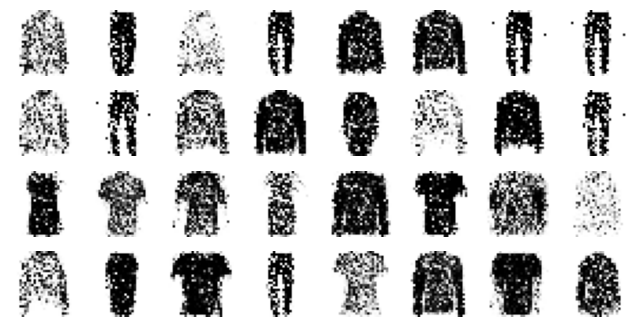

Epoch 5/10


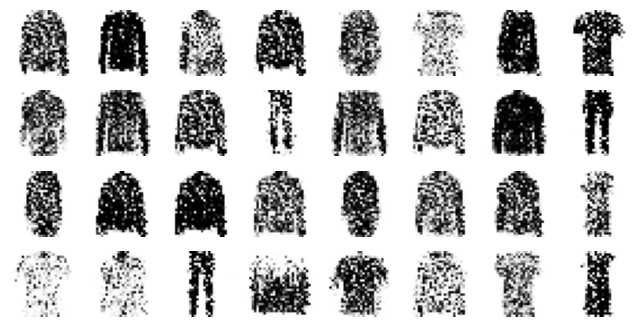

Epoch 6/10


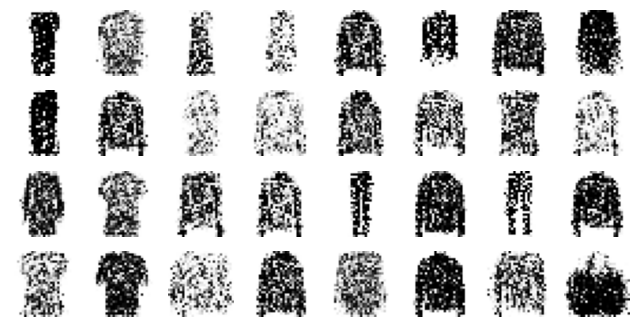

Epoch 7/10


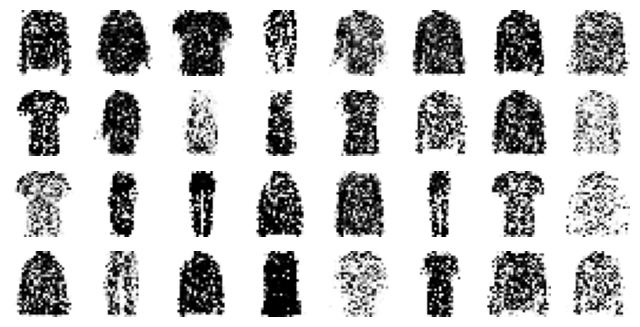

Epoch 8/10


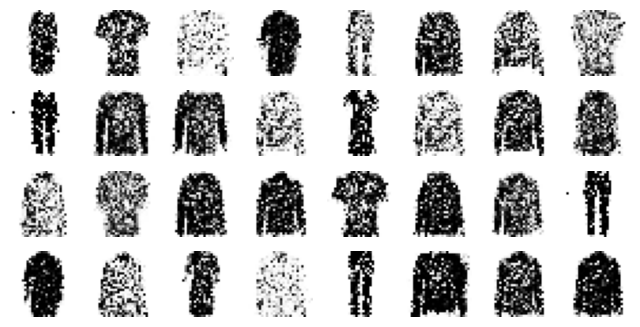

Epoch 9/10


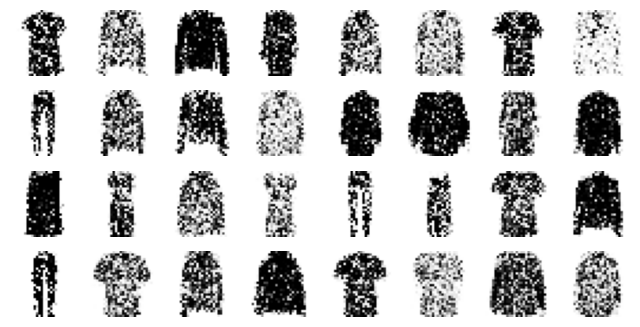

Epoch 10/10


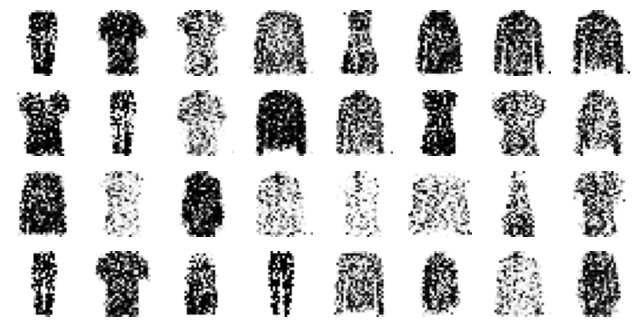

In [ ]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=10)

### Generated Images After Initial Training

Visualizing images generated by the GAN after the initial training phase.

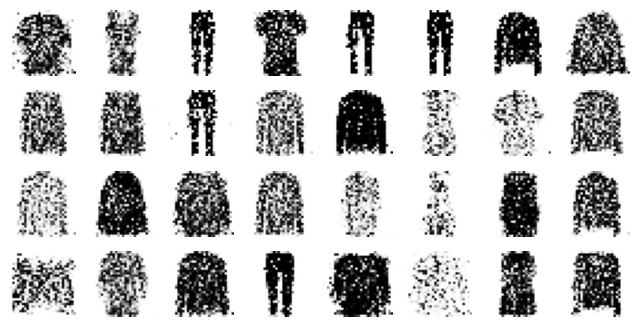

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
plt.show()

### Extended GAN Training

Continuing the training for more epochs to improve image generation quality.

Epoch 1/50


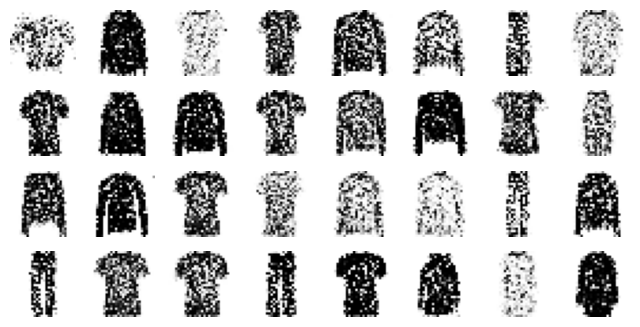

Epoch 2/50


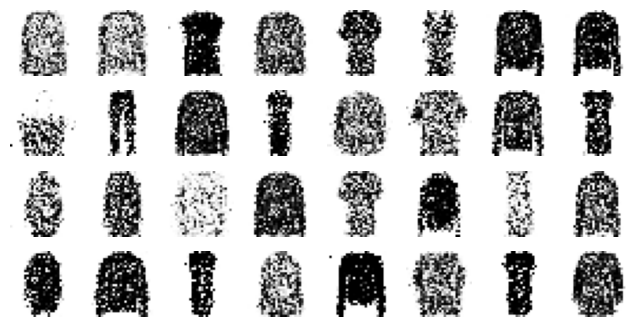

Epoch 3/50


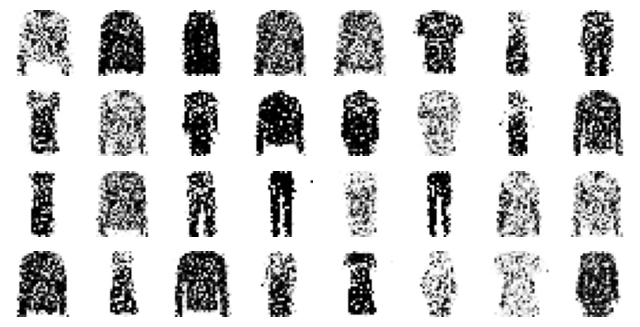

Epoch 4/50


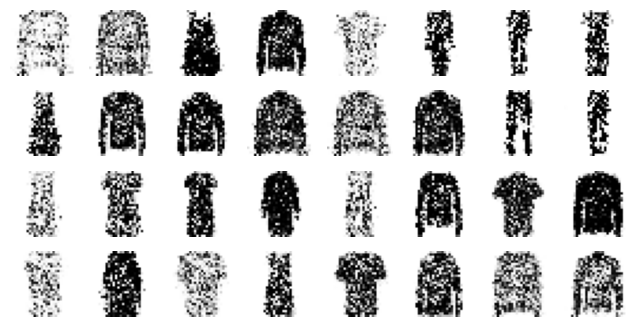

Epoch 5/50


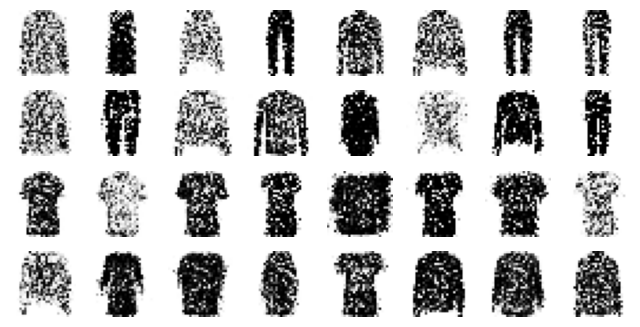

Epoch 6/50


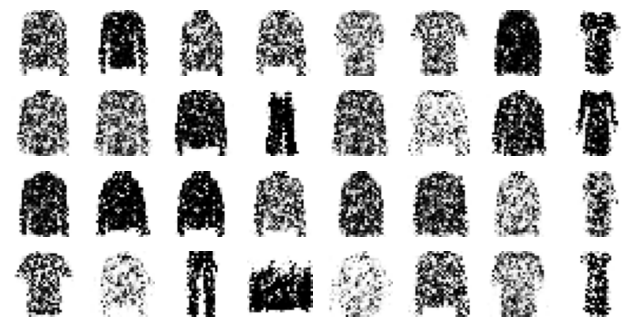

Epoch 7/50


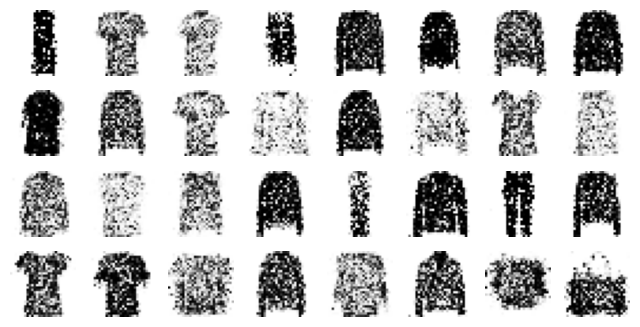

Epoch 8/50


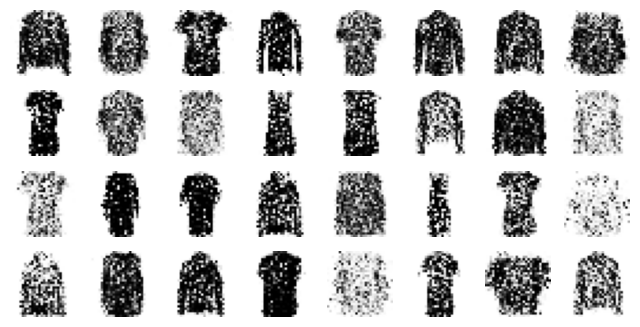

Epoch 9/50


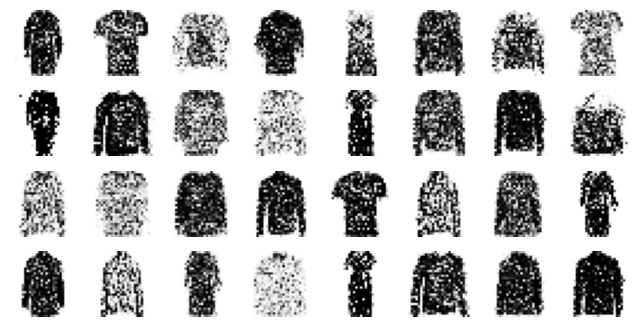

Epoch 10/50


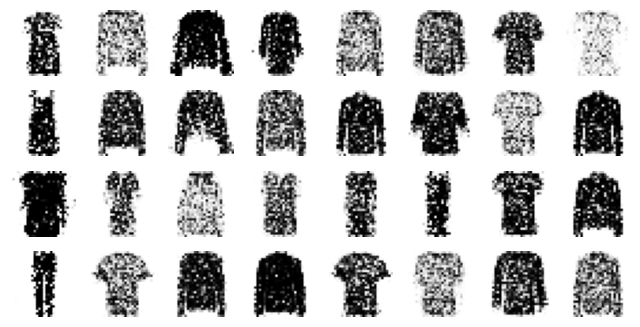

Epoch 11/50


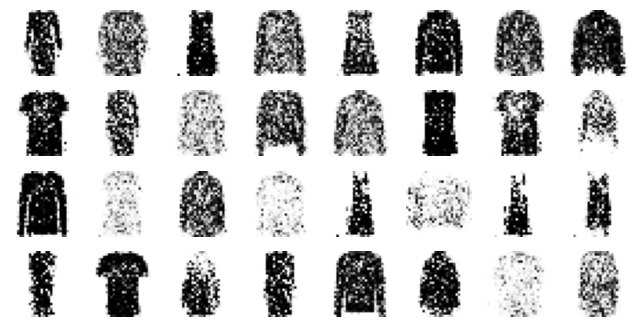

Epoch 12/50


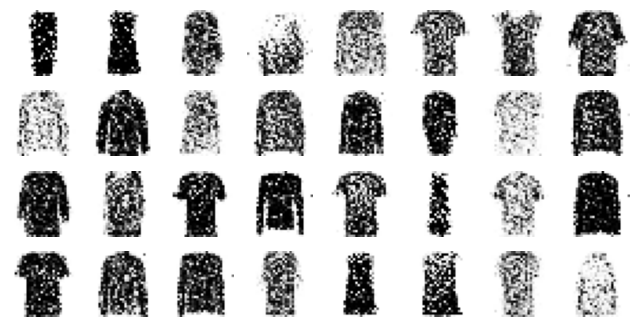

Epoch 13/50


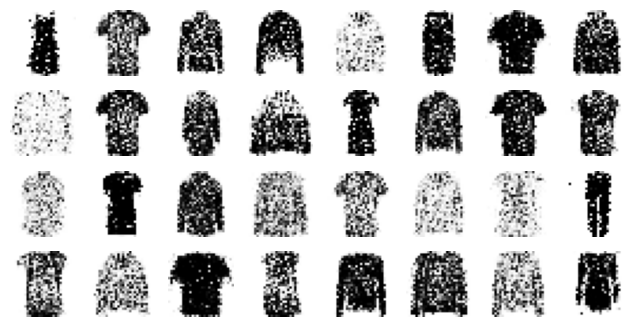

Epoch 14/50


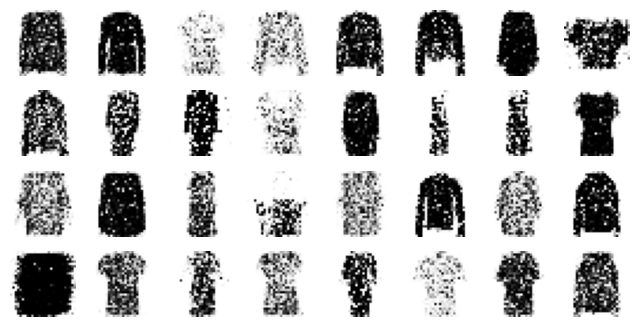

Epoch 15/50


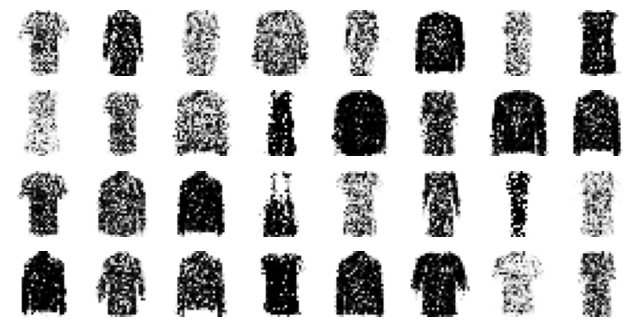

Epoch 16/50


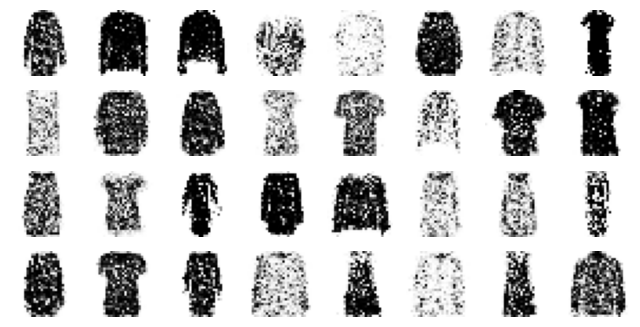

Epoch 17/50


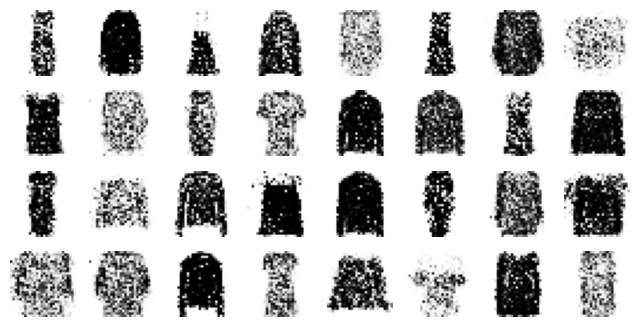

Epoch 18/50


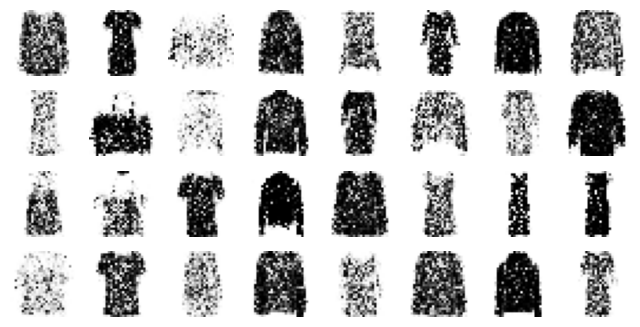

Epoch 19/50


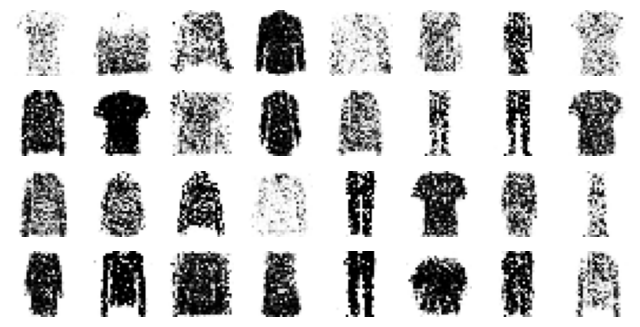

Epoch 20/50


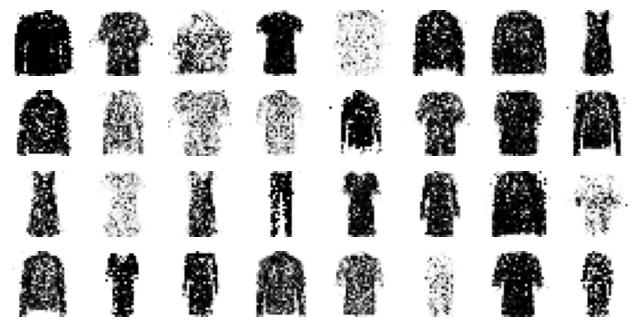

Epoch 21/50


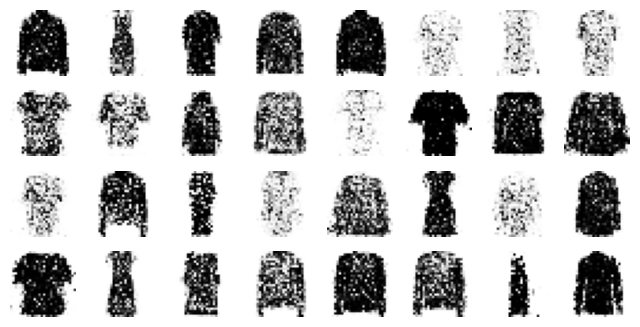

Epoch 22/50


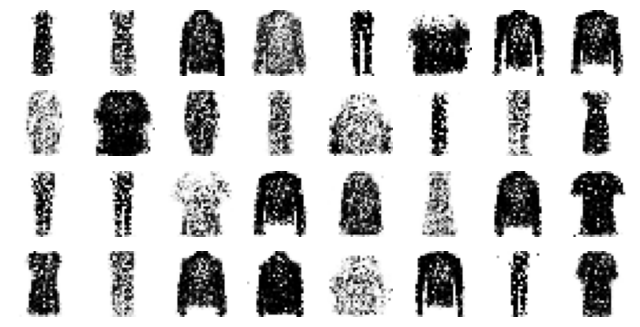

Epoch 23/50


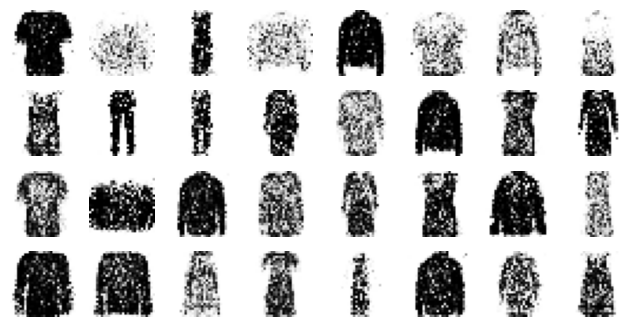

Epoch 24/50


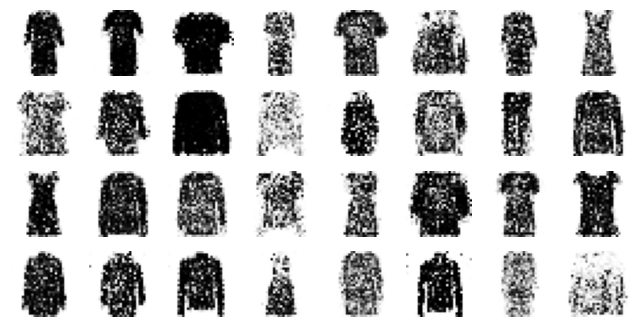

Epoch 25/50


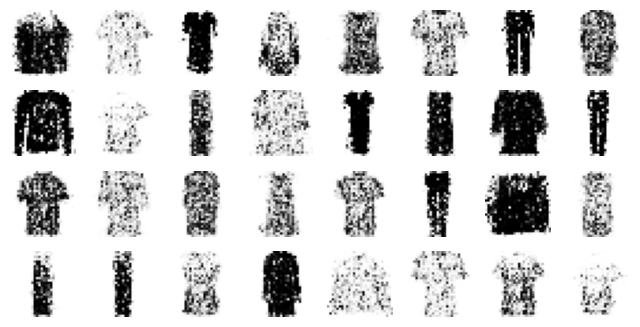

Epoch 26/50


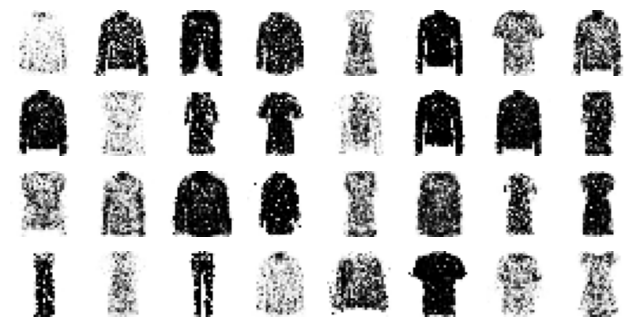

Epoch 27/50


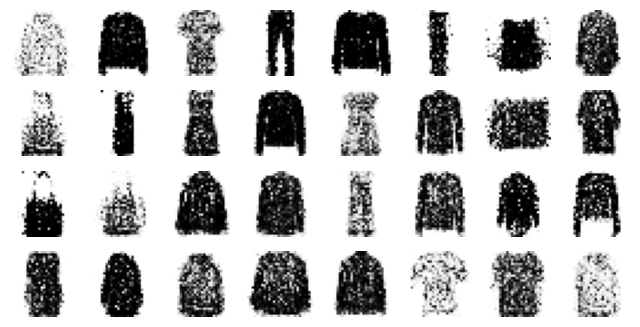

Epoch 28/50


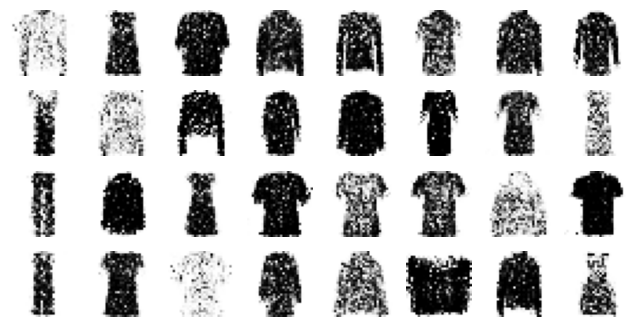

Epoch 29/50


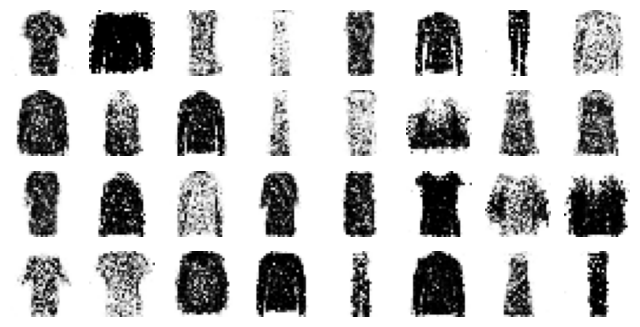

Epoch 30/50


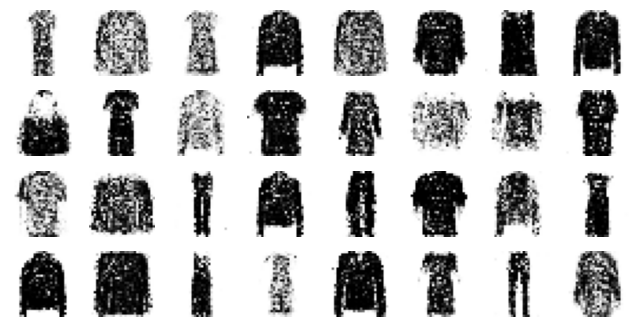

Epoch 31/50


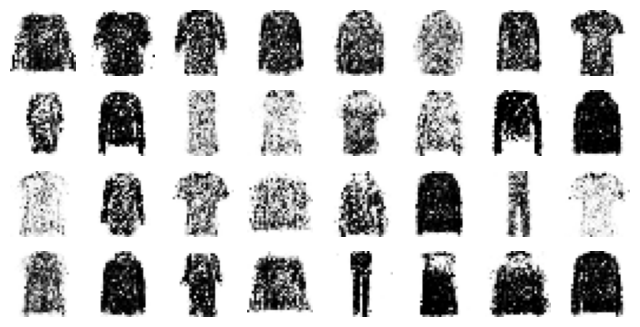

Epoch 32/50


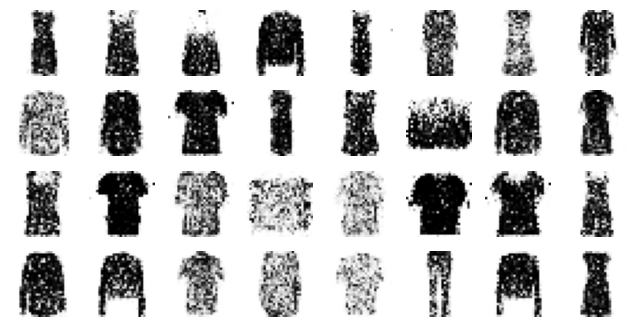

Epoch 33/50


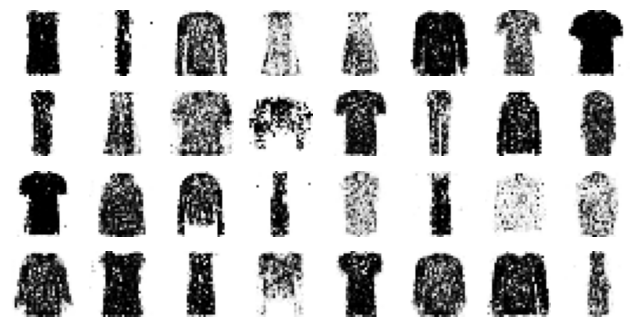

Epoch 34/50


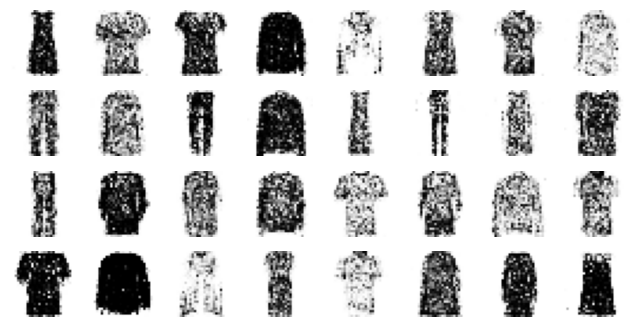

Epoch 35/50


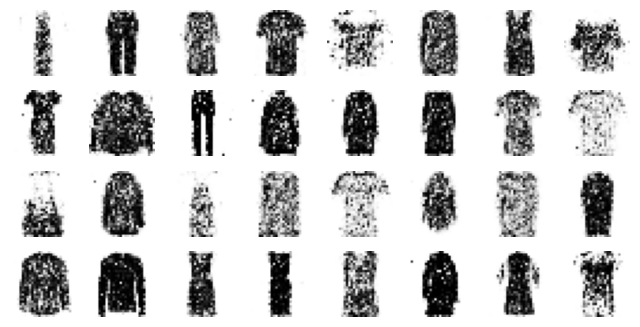

Epoch 36/50


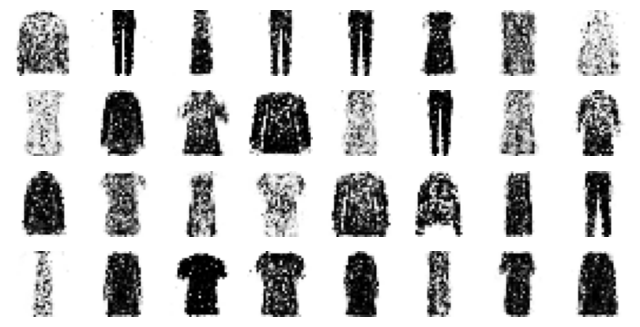

Epoch 37/50


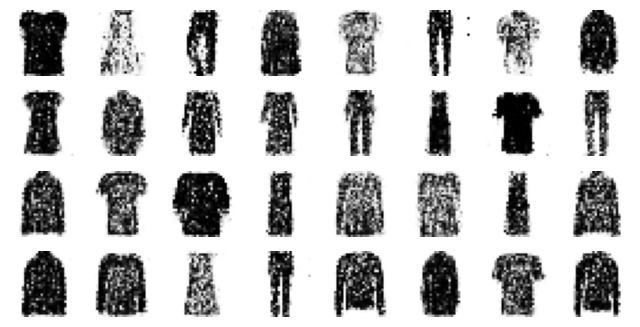

Epoch 38/50


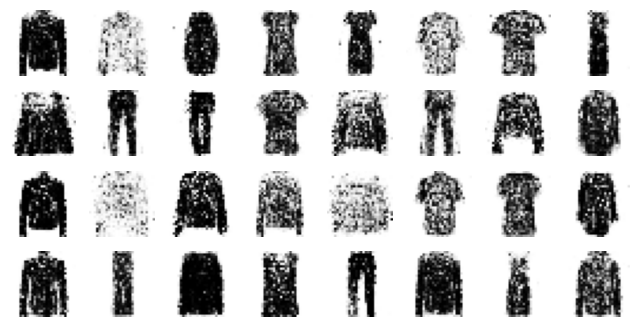

Epoch 39/50


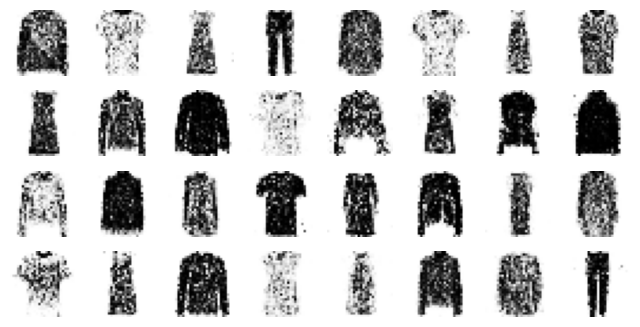

Epoch 40/50


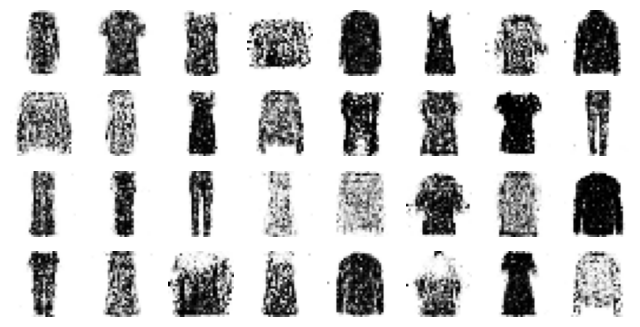

Epoch 41/50


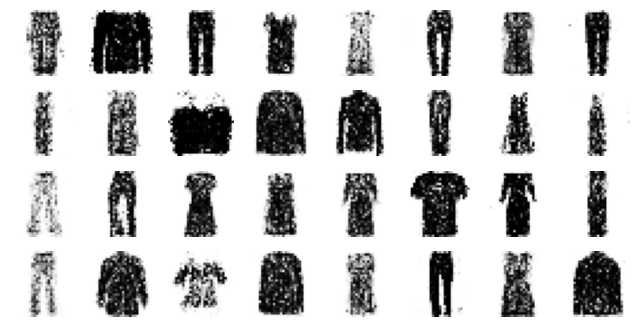

Epoch 42/50


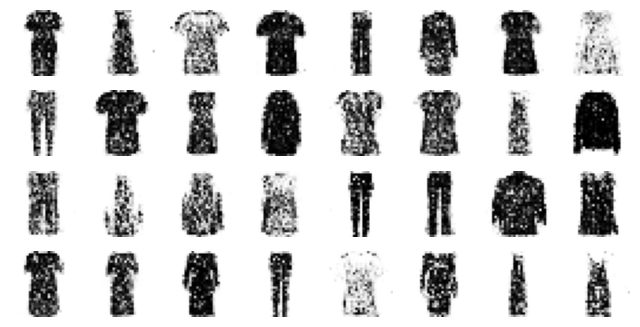

Epoch 43/50


In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

## Deep Convolutional Generative Adversarial Networks (DCGANs)

This section implements a DCGAN, which uses convolutional layers in both the generator and discriminator, typically leading to better image generation quality.

###Deep Convolition GANS

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

/usr/local/lib/python3.13/dist-packages/keras/src/layers/core/dense.py:106: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.13/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### DCGAN Model Compilation

Similar to the basic GAN, we compile the discriminator and the combined DCGAN model.

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

### DCGAN Data Preparation

Reshaping and rescaling the training data for the convolutional layers in the DCGAN.

In [ ]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

### DCGAN Dataset Setup

Setting up the batched dataset for DCGAN training.

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

### DCGAN Training and Results

Training the DCGAN and observing the generated images. The images generated at the end of the training demonstrate the model's ability to create realistic fashion items.

Epoch 1/50


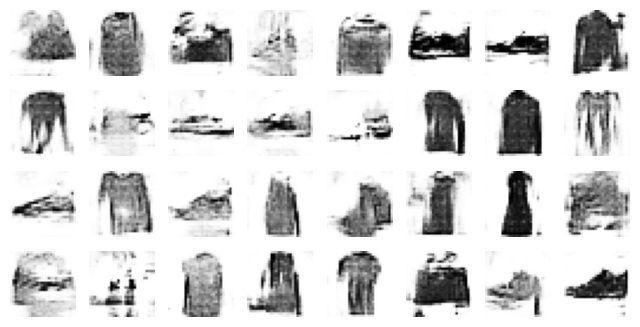

Epoch 2/50


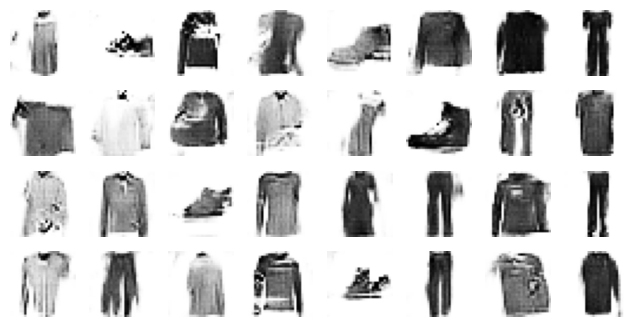

Epoch 3/50


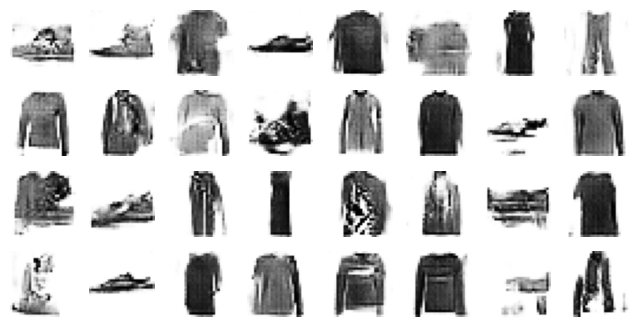

Epoch 4/50


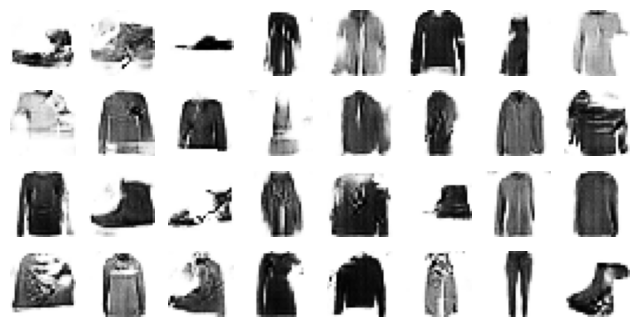

Epoch 5/50


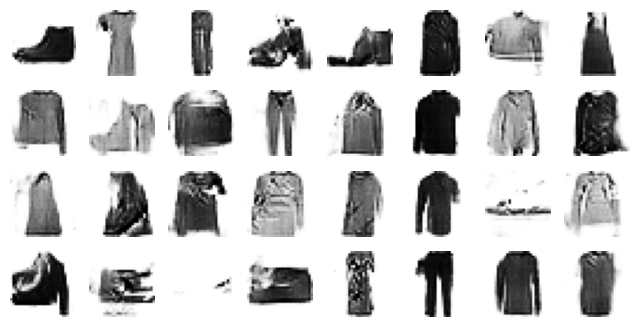

Epoch 6/50


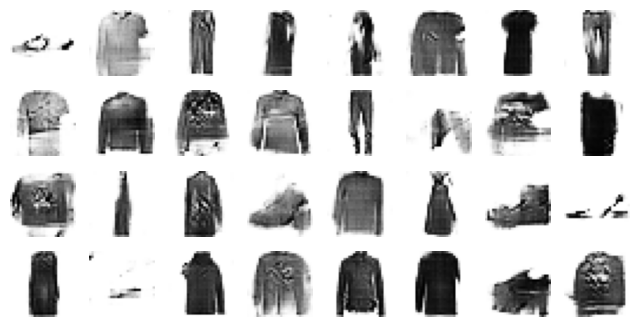

Epoch 7/50


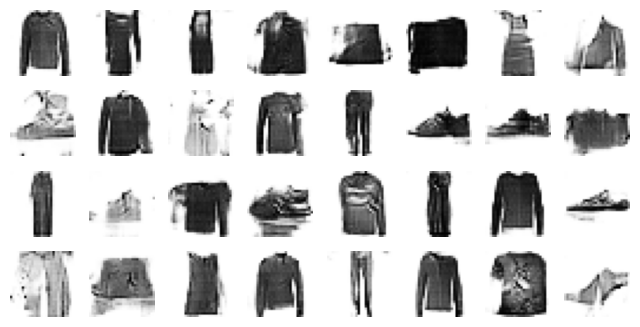

Epoch 8/50


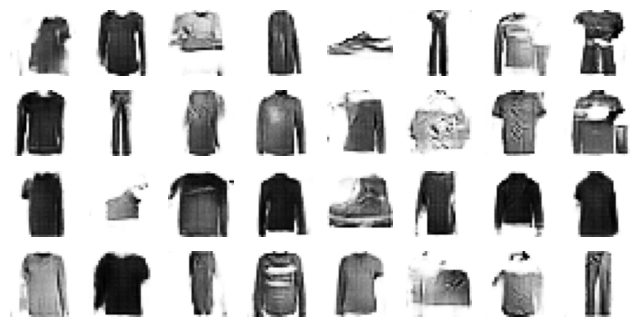

Epoch 9/50


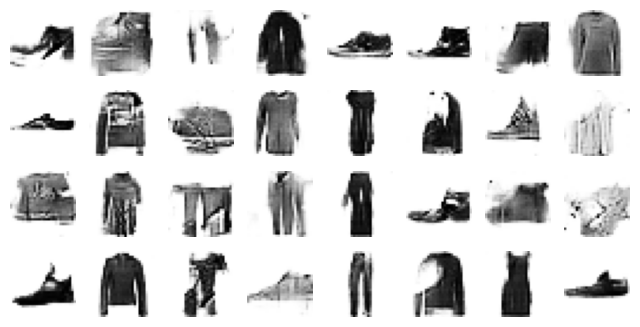

Epoch 10/50


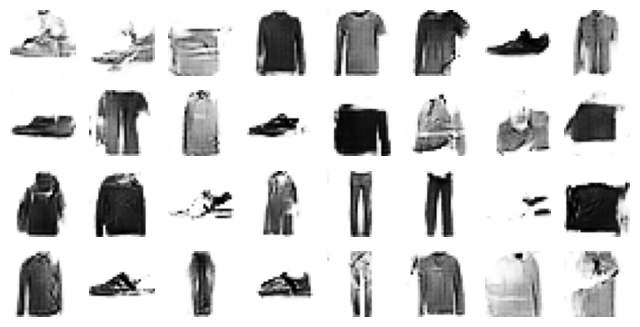

Epoch 11/50


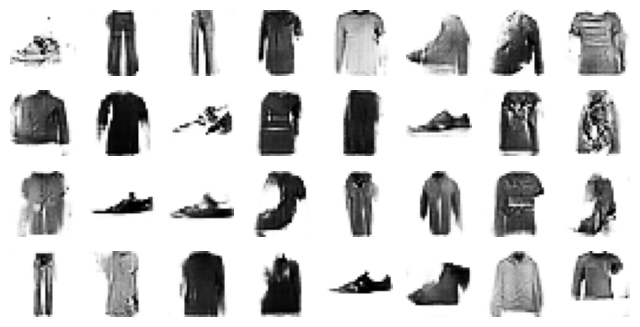

Epoch 12/50


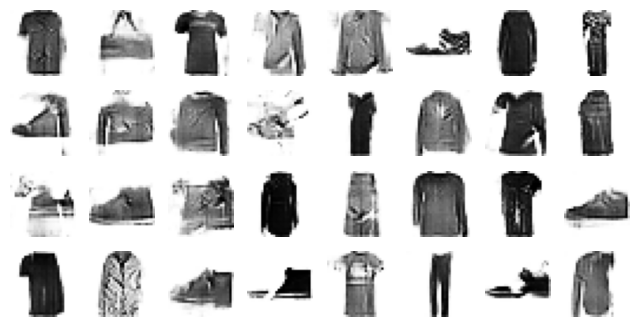

Epoch 13/50


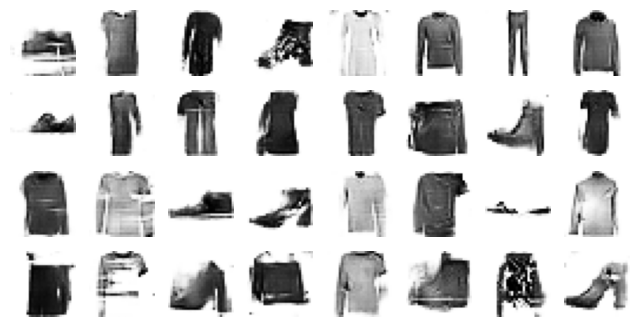

Epoch 14/50


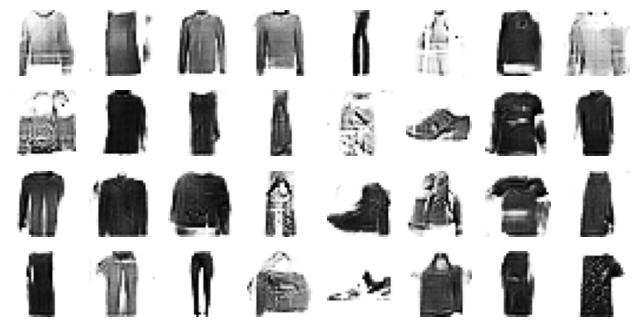

Epoch 15/50


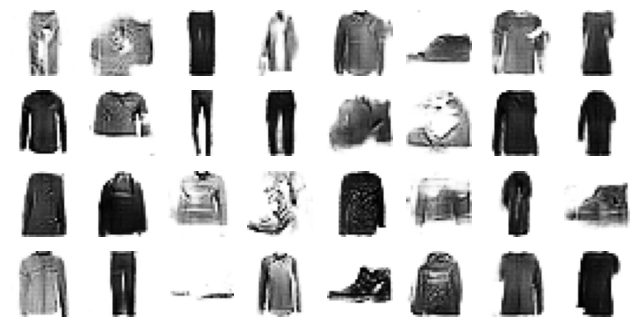

Epoch 16/50


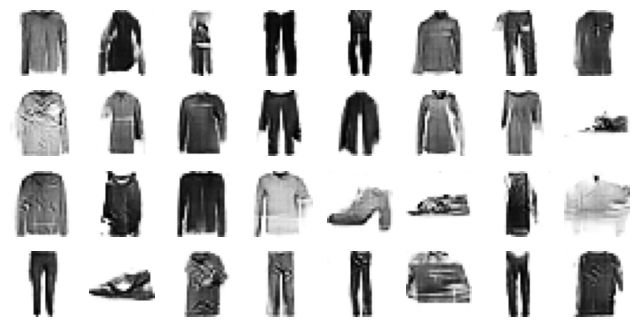

Epoch 17/50


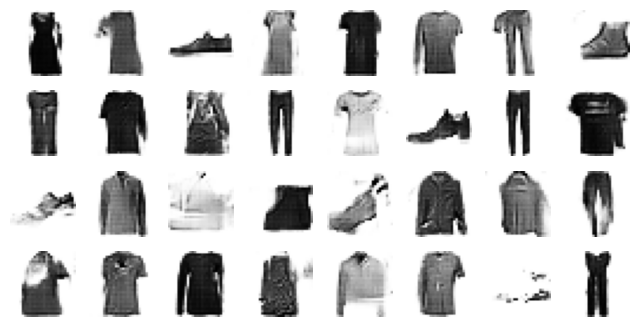

Epoch 18/50


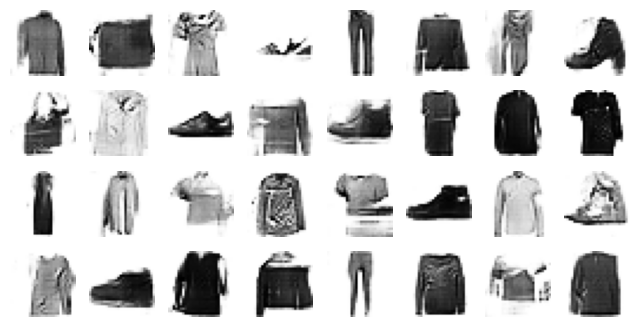

Epoch 19/50


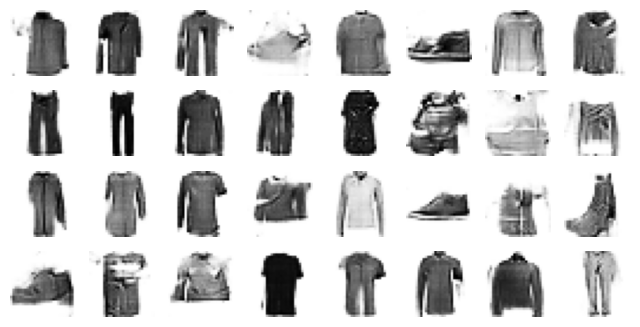

Epoch 20/50


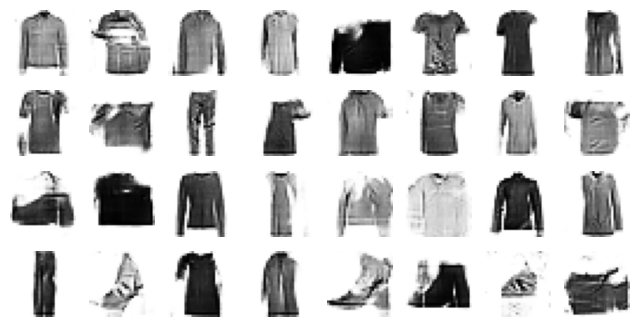

Epoch 21/50


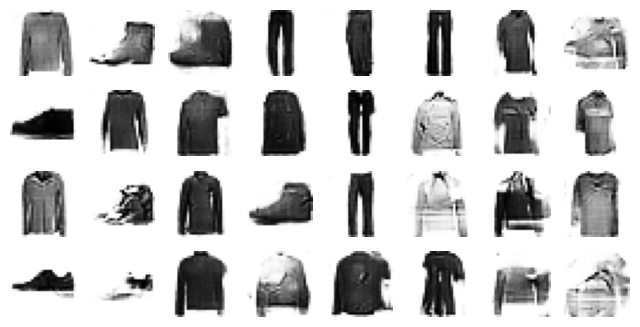

Epoch 22/50


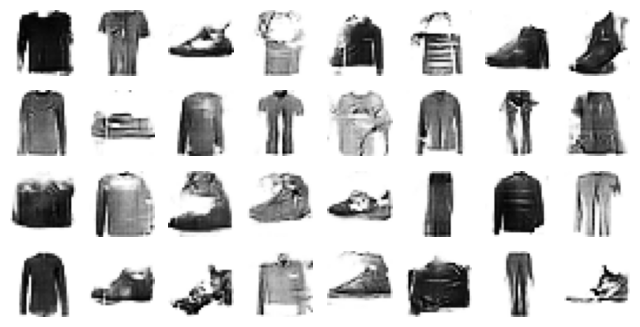

Epoch 23/50


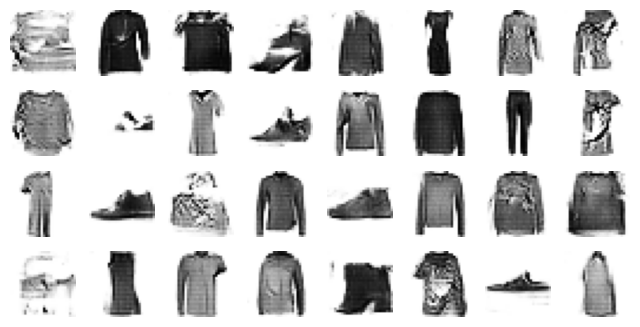

Epoch 24/50


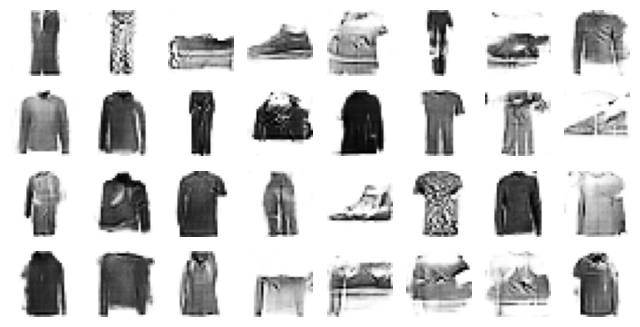

Epoch 25/50


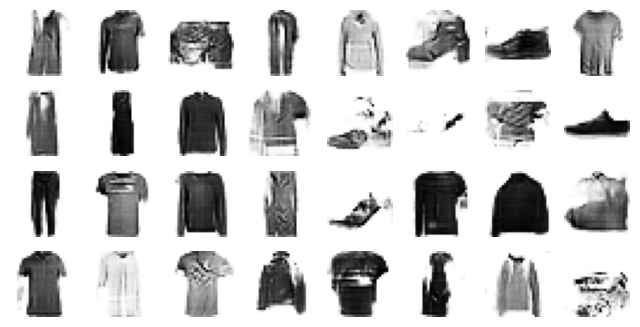

Epoch 26/50


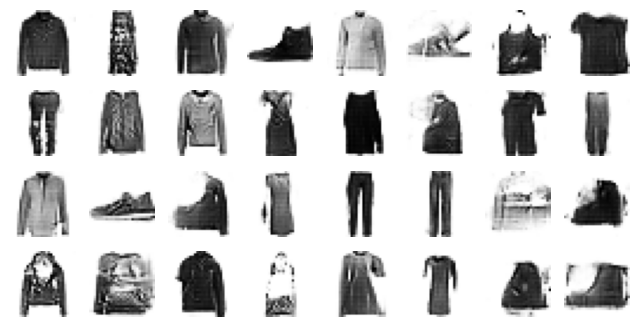

Epoch 27/50


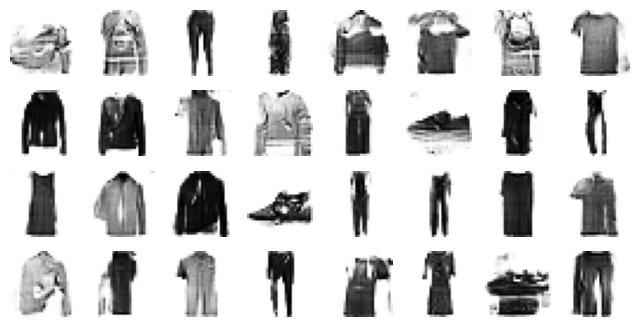

Epoch 28/50


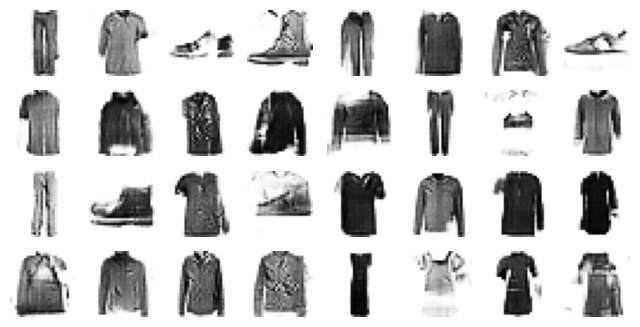

Epoch 29/50


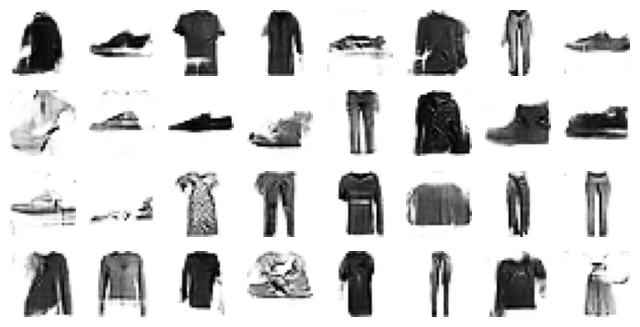

Epoch 30/50


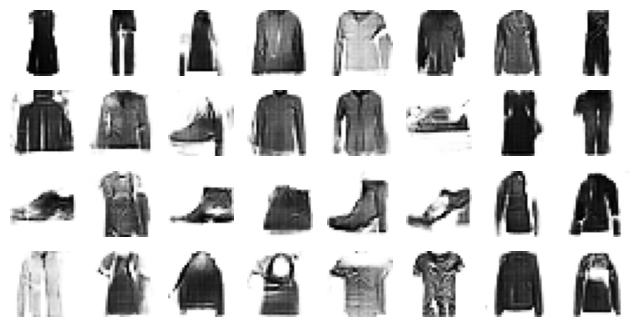

Epoch 31/50


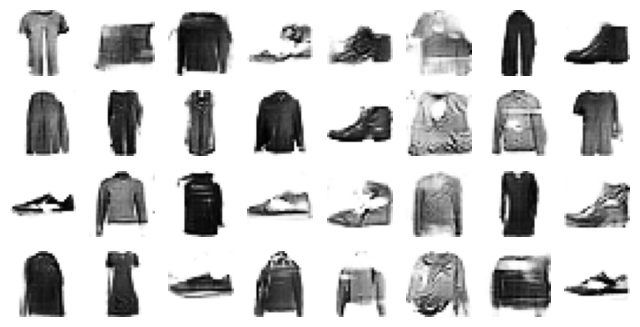

Epoch 32/50


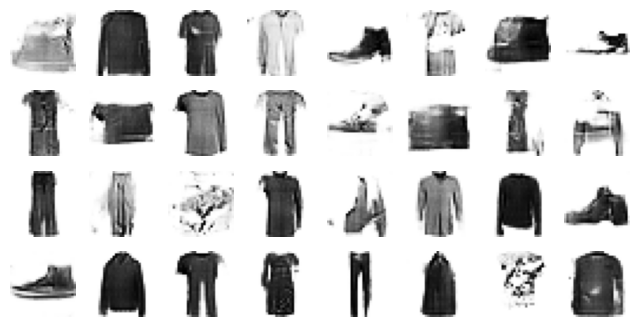

Epoch 33/50


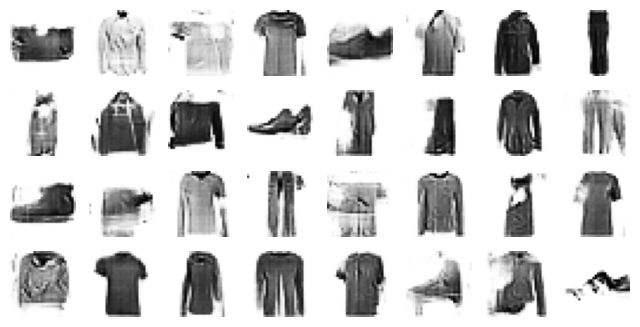

Epoch 34/50


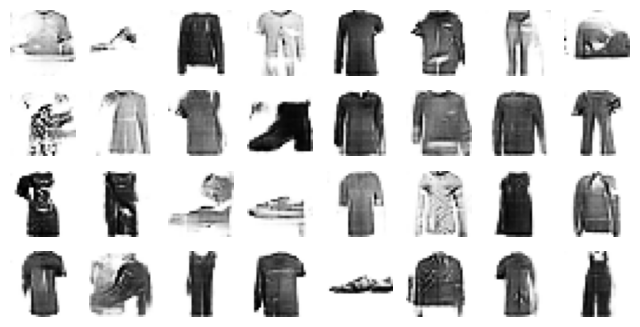

Epoch 35/50


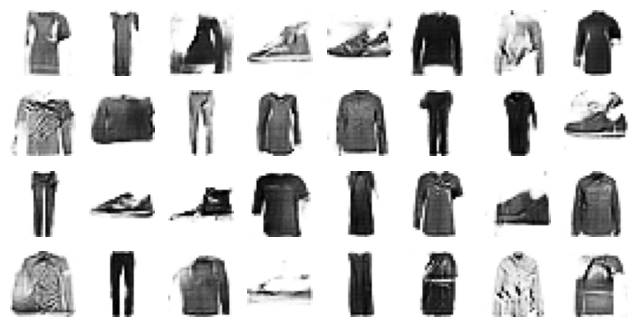

Epoch 36/50


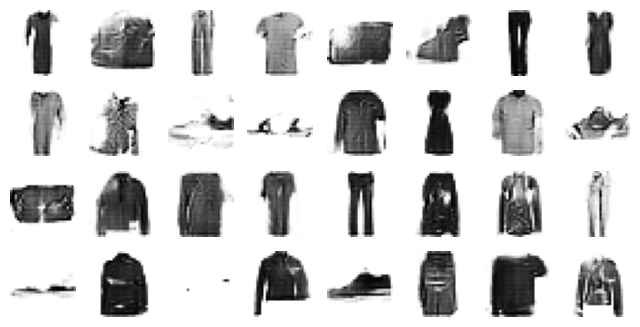

Epoch 37/50


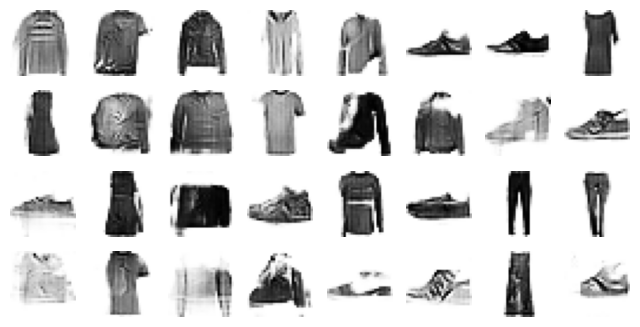

Epoch 38/50


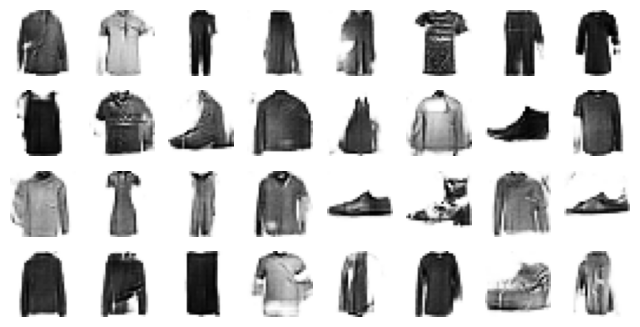

Epoch 39/50


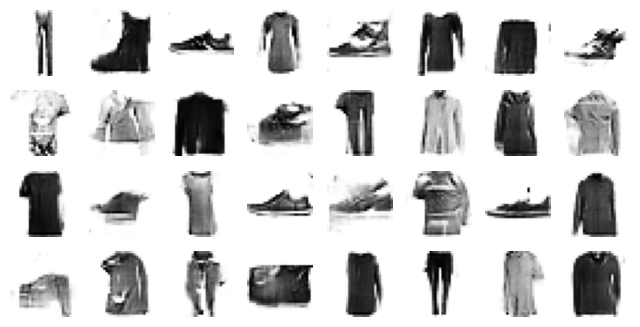

Epoch 40/50


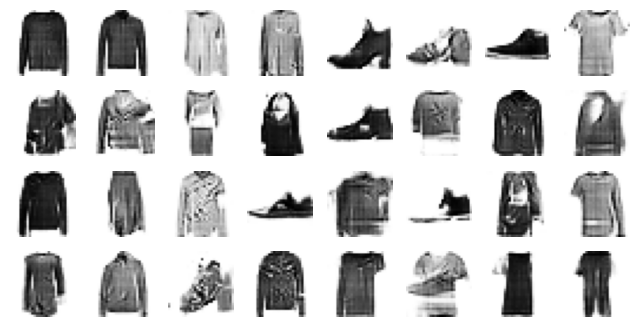

Epoch 41/50


In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

## Summary: Basic GAN vs. DCGAN

This notebook demonstrates two different Generative Adversarial Network (GAN) architectures: a basic GAN and a Deep Convolutional GAN (DCGAN). Here's a summary of their key differences and observations:

**Basic GAN (Implemented with Dense Layers):**
*   **Architecture:** Utilizes fully connected (Dense) layers for both the generator and discriminator.
*   **Input/Output:** The generator takes a latent space vector (noise) and outputs a flattened image, which is then reshaped. The discriminator takes a flattened image.
*   **Performance:** While it can learn to generate images, the quality is often limited. The initial training steps show very blurry and abstract shapes, gradually improving but not reaching high fidelity within a reasonable number of epochs. The images after extended training show some recognizable features of clothing items but lack fine details and realism.
*   **Training Challenges:** Can be prone to mode collapse or instability, and convergence can be slow.

**Deep Convolutional GAN (DCGAN):**
*   **Architecture:** Replaces fully connected layers with convolutional layers (specifically `Conv2DTranspose` in the generator and `Conv2D` in the discriminator), along with Batch Normalization.
*   **Input/Output:** The generator still takes a latent vector, but it's transformed into a spatial representation early on, and then deconvoluted to form an image. The discriminator directly processes 2D images.
*   **Performance:** Generally produces significantly better quality and more realistic images compared to the basic GAN. The convolutional layers are better at capturing spatial hierarchies and local patterns in images.
*   **Training Enhancements:** The use of Batch Normalization helps stabilize training, and `LeakyReLU` activation in the discriminator improves gradient flow, leading to more effective learning.
*   **Results:** The images generated by the DCGAN, even after fewer epochs, tend to be more distinct, have better defined shapes, and more closely resemble the target Fashion MNIST items (e.g., recognizable shoes, shirts, trousers).

**Conclusion:**

The transition from a basic GAN with dense layers to a DCGAN with convolutional layers marks a significant improvement in the ability to generate high-quality images. The DCGAN leverages the power of convolutions to better understand and synthesize visual data, making it a more effective architecture for image generation tasks.